# VBM Alzheimer's Preprocessing Pipeline Inspector

Inspect cached step outputs from the VBM preprocessing pipeline (6 steps, all scattered over subjects).  
Re-run cells as new steps complete in the cache.

**Pipeline**: BET, FAST, FLIRT, FNIRT, applywarp, fslmaths (modulation), fslmaths (smoothing)

In [1]:
import os
import glob
import json
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

from pathlib import Path
from scipy import ndimage
from scipy.ndimage import zoom
from matplotlib.colors import LinearSegmentedColormap

# === Configure paths ===
CRATE_DIR = Path("vbm_alzheimers_crate")
CACHE_DIR = CRATE_DIR / "cachedir"
ADDITIONAL_INPUTS = CRATE_DIR / "additional_inputs"
MNI_TEMPLATE = ADDITIONAL_INPUTS / "MNI152_T1_2mm.nii.gz"
MNI_BRAIN_TEMPLATE = ADDITIONAL_INPUTS / "MNI152_T1_2mm_brain.nii.gz"
RAW_DATA_DIR = Path("data/nifti")
SUBJECT_MAPPING = CACHE_DIR / "subject_mapping.json"

# === Expected output filenames ===
BET_BRAIN = "brain.nii.gz"
BET_MASK = "brain_mask.nii.gz"
FAST_GM = "tissue_pve_1.nii.gz"
FAST_WM = "tissue_pve_2.nii.gz"
FAST_CSF = "tissue_pve_0.nii.gz"
FLIRT_REGISTERED = "brain_affine.nii.gz"
FLIRT_MATRIX = "struct2mni_affine.mat"
FNIRT_WARPED = "gm_nonlinear.nii.gz"
FNIRT_WARP = "struct2mni_warp.nii.gz"
FNIRT_JACOBIAN = "jacobian.nii.gz"
APPLYWARP_GM = "gm_mni.nii.gz"
MODULATED_GM = "gm_modulated.nii.gz"
SMOOTHED_GM = "gm_smooth.nii.gz"

# === Step name to output filename mapping ===
STEP_OUTPUTS = {
    "bet": BET_BRAIN,
    "fast": FAST_GM,
    "flirt": FLIRT_REGISTERED,
    "fnirt": FNIRT_WARPED,
    "applywarp": APPLYWARP_GM,
    "fslmaths_1": MODULATED_GM,
    "fslmaths_2": SMOOTHED_GM,
}

# === Load subject mapping ===
if SUBJECT_MAPPING.exists():
    with open(SUBJECT_MAPPING) as f:
        _mapping = json.load(f)
    SUBJECTS = _mapping["subjects"]
    STEP_MAP = _mapping["steps"]
    print(f"Subject mapping loaded: {len(SUBJECTS)} subjects, {len(STEP_MAP)} steps")
else:
    SUBJECTS = []
    STEP_MAP = {}
    print("WARNING: subject_mapping.json not found — run the pipeline first")

def find_cached_files(filename_pattern, step_name=None):
    """Find cached files, ordered by subject if step_name and mapping are available."""
    if step_name and step_name in STEP_MAP and SUBJECTS:
        # Use subject mapping for deterministic ordering
        results = []
        for subj in SUBJECTS:
            cache_hash = STEP_MAP[step_name].get(subj)
            if cache_hash:
                cache_subdir = CACHE_DIR / cache_hash
                matches = list(cache_subdir.glob(filename_pattern))
                results.extend(matches)
        return results
    
    # Fallback: scan all cache dirs (unordered)
    results = []
    if not CACHE_DIR.exists():
        print("Cache directory not found.")
        return results
    for status_file in sorted(CACHE_DIR.glob("*.status")):
        status = status_file.read_text().strip()
        if status != "success":
            continue
        cache_hash = status_file.stem
        cache_subdir = CACHE_DIR / cache_hash
        if cache_subdir.is_dir():
            matches = list(cache_subdir.glob(filename_pattern))
            for m in matches:
                results.append(m)
    return sorted(results)

def show_slices(img_data, title="", slices=None, cmap="gray", vmin=None, vmax=None):
    """Display axial, coronal, sagittal slices of a 3D volume."""
    if slices is None:
        shape = img_data.shape[:3]
        slices = [s // 2 for s in shape]
    fig, axes = plt.subplots(1, 3, figsize=(14, 4))
    axes[0].imshow(np.rot90(img_data[slices[0], :, :]), cmap=cmap, vmin=vmin, vmax=vmax)
    axes[0].set_title(f"Sagittal (x={slices[0]})")
    axes[1].imshow(np.rot90(img_data[:, slices[1], :]), cmap=cmap, vmin=vmin, vmax=vmax)
    axes[1].set_title(f"Coronal (y={slices[1]})")
    axes[2].imshow(np.rot90(img_data[:, :, slices[2]]), cmap=cmap, vmin=vmin, vmax=vmax)
    axes[2].set_title(f"Axial (z={slices[2]})")
    for ax in axes:
        ax.axis("off")
    fig.suptitle(title, fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()

def show_overlay(bg_data, fg_data, title="", alpha=0.4, fg_cmap="hot", fg_thresh=0.0):
    """Overlay foreground on background at mid-slices."""
    shape = bg_data.shape[:3]
    slices = [s // 2 for s in shape]
    fg_masked = np.ma.masked_where(fg_data <= fg_thresh, fg_data)
    fig, axes = plt.subplots(1, 3, figsize=(14, 4))
    for ax, dim, s in zip(axes, ["Sagittal", "Coronal", "Axial"], range(3)):
        idx = [slice(None)] * 3
        idx[s] = slices[s]
        bg_slice = np.rot90(bg_data[tuple(idx)])
        fg_slice = np.rot90(fg_masked[tuple(idx)])
        ax.imshow(bg_slice, cmap="gray")
        ax.imshow(fg_slice, cmap=fg_cmap, alpha=alpha)
        ax.set_title(f"{dim} ({['x','y','z'][s]}={slices[s]})")
        ax.axis("off")
    fig.suptitle(title, fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()

# Summary of cache status
status_files = list(CACHE_DIR.glob("*.status")) if CACHE_DIR.exists() else []
success = sum(1 for f in status_files if f.read_text().strip() == "success")
failed = sum(1 for f in status_files if f.read_text().strip() == "permanentFail")
pending = sum(1 for f in status_files if f.read_text().strip() == "")
print(f"Cache: {len(status_files)} entries | {success} success | {failed} failed | {pending} pending")

Cache: 0 entries | 0 success | 0 failed | 0 pending


## Generate Subject Mapping

Build `subject_mapping.json` to ensure consistent subject ordering across all pipeline steps.  
Maps each cache hash to its pipeline step and subject by:
- **BET/FAST** (native space): matching affine matrices to raw T1w inputs
- **FLIRT onward** (MNI space): using `.status` file timestamps (cwltool processes scatter elements in input-array order)

**Run this cell once** after the pipeline completes. Subsequent runs of the notebook will load the mapping automatically from the setup cell above.

In [2]:
# === Build subject_mapping.json ===
# Only needs to run once after the pipeline completes.

# Figure subjects in job-file order (same as bet_input array in vbm_alzheimer_job_figure.yml)
FIGURE_SUBJECTS = ["OAS1_0001_MR1", "OAS1_0002_MR1", "OAS1_0010_MR1", "OAS1_0011_MR1", "OAS1_0018_MR1"]

# --- Step 1: Classify cache hashes by pipeline step ---
STEP_SIGNATURES = {
    "bet":        lambda d: (d / BET_BRAIN).exists() and (d / BET_MASK).exists(),
    "fast":       lambda d: (d / FAST_GM).exists() and (d / FAST_CSF).exists(),
    "flirt":      lambda d: (d / FLIRT_REGISTERED).exists() and (d / FLIRT_MATRIX).exists(),
    "fnirt":      lambda d: (d / FNIRT_WARP).exists() and (d / FNIRT_JACOBIAN).exists(),
    "applywarp":  lambda d: (d / APPLYWARP_GM).exists(),
    "fslmaths_1": lambda d: (d / MODULATED_GM).exists(),
    "fslmaths_2": lambda d: (d / SMOOTHED_GM).exists(),
}

step_hashes = {step: [] for step in STEP_SIGNATURES}
for status_file in CACHE_DIR.glob("*.status"):
    if status_file.read_text().strip() != "success":
        continue
    cache_hash = status_file.stem
    cache_dir = CACHE_DIR / cache_hash
    if not cache_dir.is_dir():
        continue
    for step, check_fn in STEP_SIGNATURES.items():
        if check_fn(cache_dir):
            mtime = status_file.stat().st_mtime
            step_hashes[step].append((mtime, cache_hash))
            break

# Sort each step by timestamp (cwltool processes scatter elements in array order)
for step in step_hashes:
    step_hashes[step].sort(key=lambda x: x[0])

print("Cache hashes per step (sorted by timestamp):")
for step, entries in step_hashes.items():
    print(f"  {step}: {len(entries)} entries")

# --- Step 2: Match BET to subjects via affine comparison ---
# BET preserves native-space affine, so BET brain.nii.gz affine == raw T1w affine
raw_affines = {}
for subj in FIGURE_SUBJECTS:
    img = nib.load(RAW_DATA_DIR / f"{subj}.nii.gz")
    raw_affines[subj] = img.affine

bet_mapping = {}  # subject -> hash
for _, cache_hash in step_hashes["bet"]:
    bet_img = nib.load(CACHE_DIR / cache_hash / BET_BRAIN)
    bet_affine = bet_img.affine
    for subj, raw_aff in raw_affines.items():
        if subj not in bet_mapping and np.allclose(bet_affine, raw_aff, atol=1e-4):
            bet_mapping[subj] = cache_hash
            break

print(f"\nBET affine matching: {len(bet_mapping)}/{len(FIGURE_SUBJECTS)} subjects matched")
for subj, h in bet_mapping.items():
    print(f"  {subj} -> {h[:16]}...")

# --- Step 3: Match FAST to subjects via affine comparison ---
fast_mapping = {}
for _, cache_hash in step_hashes["fast"]:
    fast_img = nib.load(CACHE_DIR / cache_hash / FAST_GM)
    fast_affine = fast_img.affine
    for subj, raw_aff in raw_affines.items():
        if subj not in fast_mapping and np.allclose(fast_affine, raw_aff, atol=1e-4):
            fast_mapping[subj] = cache_hash
            break

print(f"\nFAST affine matching: {len(fast_mapping)}/{len(FIGURE_SUBJECTS)} subjects matched")

# --- Step 4: MNI-space steps use timestamp ordering ---
# cwltool processes scatter elements in input-array order, so timestamp order == subject order
mni_steps = ["flirt", "fnirt", "applywarp", "fslmaths_1", "fslmaths_2"]
mni_mappings = {}
for step in mni_steps:
    entries = step_hashes[step]
    if len(entries) != len(FIGURE_SUBJECTS):
        print(f"WARNING: {step} has {len(entries)} entries, expected {len(FIGURE_SUBJECTS)}")
        continue
    mni_mappings[step] = {subj: h for subj, (_, h) in zip(FIGURE_SUBJECTS, entries)}

print(f"\nMNI-space steps mapped via timestamps: {list(mni_mappings.keys())}")

# --- Step 5: Assemble and save ---
mapping = {
    "subjects": FIGURE_SUBJECTS,
    "steps": {
        "bet": bet_mapping,
        "fast": fast_mapping,
        **mni_mappings,
    }
}

with open(SUBJECT_MAPPING, "w") as f:
    json.dump(mapping, f, indent=2)

print(f"\nSaved subject_mapping.json with {len(mapping['subjects'])} subjects, {len(mapping['steps'])} steps")

# Reload into globals so downstream cells use it immediately
SUBJECTS = mapping["subjects"]
STEP_MAP = mapping["steps"]

Cache hashes per step (sorted by timestamp):
  bet: 5 entries
  fast: 5 entries
  flirt: 5 entries
  fnirt: 5 entries
  applywarp: 5 entries
  fslmaths_1: 5 entries
  fslmaths_2: 5 entries

BET affine matching: 5/5 subjects matched
  OAS1_0001_MR1 -> 33a0173773436a0a...
  OAS1_0002_MR1 -> 5d63b59cd4502dfe...
  OAS1_0010_MR1 -> 7d6a8c16bc84f425...
  OAS1_0011_MR1 -> b7e589036794332e...
  OAS1_0018_MR1 -> 6fcdd664ab15e8c0...

FAST affine matching: 5/5 subjects matched

MNI-space steps mapped via timestamps: ['flirt', 'fnirt', 'applywarp', 'fslmaths_1', 'fslmaths_2']

Saved subject_mapping.json with 5 subjects, 7 steps


## Step 1: Original T1-weighted Images

Raw structural MRI scans before any preprocessing.  
These are the inputs to the VBM pipeline (fed into BET as the first step).

Original T1w images: 5 subjects found


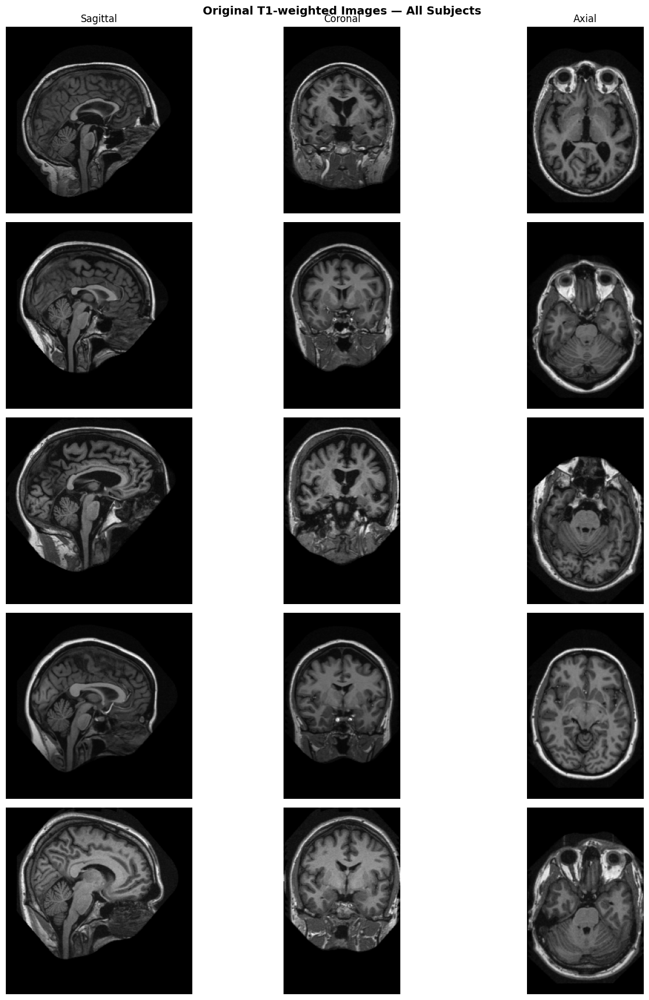


T1w image info:
  OAS1_0001_MR1.nii.gz: shape=(160, 256, 256), voxel=(np.float32(1.0), np.float32(1.0), np.float32(1.0))mm
  OAS1_0002_MR1.nii.gz: shape=(160, 256, 256), voxel=(np.float32(1.0), np.float32(1.0), np.float32(1.0))mm
  OAS1_0010_MR1.nii.gz: shape=(160, 256, 256), voxel=(np.float32(1.0), np.float32(1.0), np.float32(1.0))mm
  OAS1_0011_MR1.nii.gz: shape=(160, 256, 256), voxel=(np.float32(1.0), np.float32(1.0), np.float32(1.0))mm
  OAS1_0018_MR1.nii.gz: shape=(160, 256, 256), voxel=(np.float32(1.0), np.float32(1.0), np.float32(1.0))mm


In [3]:
# === Original T1w images for the figure subjects ===
if not SUBJECTS:
    print("WARNING: No subject mapping loaded. Run the mapping generator cell first.")
else:
    t1w_files = [RAW_DATA_DIR / f"{s}.nii.gz" for s in SUBJECTS]
    t1w_files = [f for f in t1w_files if f.exists()]
    n_subj = len(t1w_files)
    print(f"Original T1w images: {n_subj} subjects found")

    if t1w_files:
        fig, axes = plt.subplots(n_subj, 3, figsize=(14, 3.5 * n_subj))
        if n_subj == 1:
            axes = axes[np.newaxis, :]

        for i, tf in enumerate(t1w_files):
            t1_data = nib.load(tf).get_fdata()
            shape = t1_data.shape[:3]
            mid = [s // 2 for s in shape]
            for col, (s, label) in enumerate(zip(mid, ["Sagittal", "Coronal", "Axial"])):
                idx = [slice(None)] * 3
                idx[col] = s
                axes[i, col].imshow(np.rot90(t1_data[tuple(idx)]), cmap="gray")
                axes[i, col].axis("off")
                if i == 0:
                    axes[i, col].set_title(label, fontsize=12)
            axes[i, 0].set_ylabel(SUBJECTS[i], fontsize=11, fontweight="bold",
                                   rotation=0, labelpad=80, va="center")

        fig.suptitle("Original T1-weighted Images — All Subjects", fontsize=14, fontweight="bold")
        plt.tight_layout()
        plt.show()

        print(f"\nT1w image info:")
        for tf in t1w_files:
            img = nib.load(tf)
            print(f"  {tf.name}: shape={img.shape}, voxel={tuple(round(v,2) for v in img.header.get_zooms()[:3])}mm")
    else:
        print("No T1w images found in", RAW_DATA_DIR)

## Step 2: BET (Brain Extraction)

Expected outputs: `brain.nii.gz`, `brain_mask.nii.gz`

BET: 5 brain extractions, 5 masks found


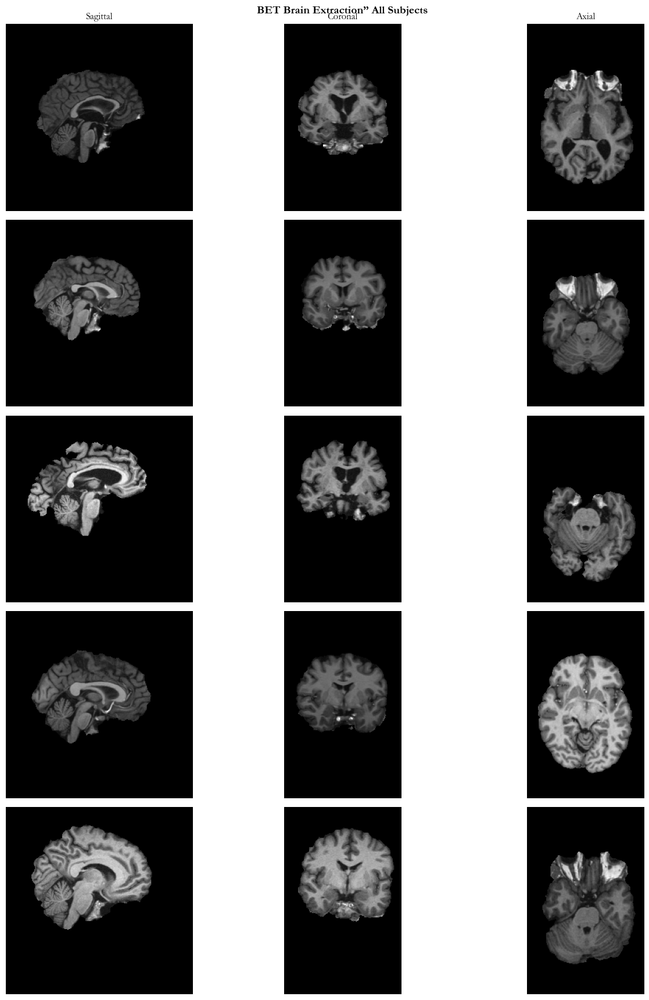

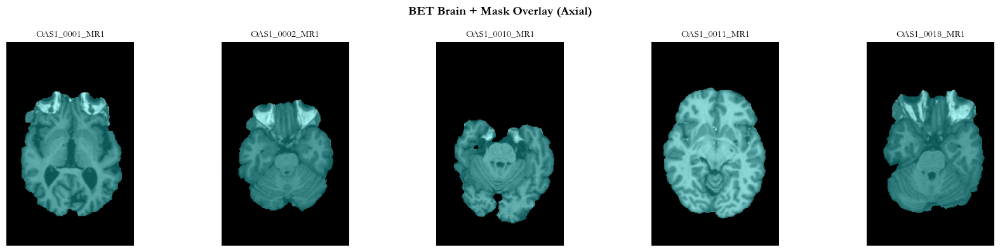


Brain volume stats across 5 subjects:
  Subject 1: 1266.0 mL
  Subject 2: 1169.0 mL
  Subject 3: 1291.5 mL
  Subject 4: 1323.2 mL
  Subject 5: 1643.0 mL


In [ ]:
bet_brains = find_cached_files(BET_BRAIN, step_name="bet")
bet_masks = find_cached_files(BET_MASK, step_name="bet")
n_subj = len(bet_brains)
print(f"BET: {n_subj} brain extractions, {len(bet_masks)} masks found")

if bet_brains:
    # Grid: subjects (sagittal, coronal, axial)
    fig, axes = plt.subplots(n_subj, 3, figsize=(14, 3.5 * n_subj))
    if n_subj == 1:
        axes = axes[np.newaxis, :]

    for i, bf in enumerate(bet_brains):
        brain_data = nib.load(bf).get_fdata()
        shape = brain_data.shape[:3]
        mid = [s // 2 for s in shape]
        for col, (s, label) in enumerate(zip(mid, ["Sagittal", "Coronal", "Axial"])):
            idx = [slice(None)] * 3
            idx[col] = s
            axes[i, col].imshow(np.rot90(brain_data[tuple(idx)]), cmap="gray")
            axes[i, col].axis("off")
            if i == 0:
                axes[i, col].set_title(label, fontsize=12)
        axes[i, 0].set_ylabel(SUBJECTS[i] if SUBJECTS else f"Subj {i+1}", fontsize=11, fontweight="bold",
                               rotation=0, labelpad=40, va="center")

    fig.suptitle("BET Brain Extraction” All Subjects", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()

    # Mask overlay for all subjects (axial only)
    if bet_masks:
        fig2, axes2 = plt.subplots(1, n_subj, figsize=(3.5 * n_subj, 4))
        if n_subj == 1:
            axes2 = [axes2]
        for i, (bf, mf) in enumerate(zip(bet_brains, bet_masks)):
            brain_data = nib.load(bf).get_fdata()
            mask_data = nib.load(mf).get_fdata()
            z = brain_data.shape[2] // 2
            axes2[i].imshow(np.rot90(brain_data[:, :, z]), cmap="gray")
            mask_masked = np.ma.masked_where(mask_data[:, :, z] <= 0, mask_data[:, :, z])
            axes2[i].imshow(np.rot90(mask_masked), cmap="cool", alpha=0.3)
            axes2[i].set_title(SUBJECTS[i] if SUBJECTS else f"Subj {i+1}", fontsize=11)
            axes2[i].axis("off")
        fig2.suptitle("BET Brain + Mask Overlay (Axial)", fontsize=14, fontweight="bold")
        plt.tight_layout()
        plt.show()

    print(f"\nBrain volume stats across {n_subj} subjects:")
    for i, bf in enumerate(bet_brains):
        bd = nib.load(bf).get_fdata()
        voxel_vol = np.prod(nib.load(bf).header.get_zooms()[:3])
        brain_vol_ml = np.sum(bd > 0) * voxel_vol / 1000
        print(f"  Subject {i+1}: {brain_vol_ml:.1f} mL")
else:
    print("No BET outputs found yet. Re-run this cell after BET steps complete.")

## Step 3: FAST (Tissue Segmentation)

Expected outputs: `tissue_pve_0.nii.gz` (CSF), `tissue_pve_1.nii.gz` (GM), `tissue_pve_2.nii.gz` (WM), `tissue_restore.nii.gz`

FAST: 5 GM maps, 5 WM maps, 5 CSF maps found


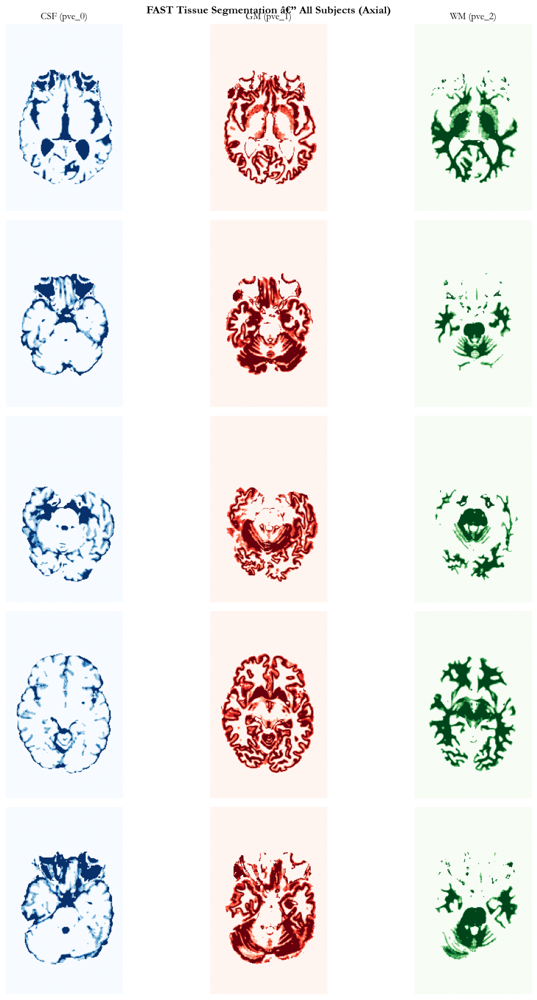


GM volume (pve_1 > 0.5) across 5 subjects:
  Subject 1: 580.6 mL
  Subject 2: 538.6 mL
  Subject 3: 488.5 mL
  Subject 4: 588.3 mL
  Subject 5: 713.3 mL


In [126]:
fast_gm = find_cached_files(FAST_GM, step_name="fast")
fast_wm = find_cached_files(FAST_WM, step_name="fast")
fast_csf = find_cached_files(FAST_CSF, step_name="fast")
n_subj = len(fast_gm)
print(f"FAST: {n_subj} GM maps, {len(fast_wm)} WM maps, {len(fast_csf)} CSF maps found")

if fast_gm:
    # Grid: subjects (rows) Ã— tissue types (cols: CSF, GM, WM) â€” axial view
    fig, axes = plt.subplots(n_subj, 3, figsize=(12, 3.5 * n_subj))
    if n_subj == 1:
        axes = axes[np.newaxis, :]

    tissue_labels = ["CSF (pve_0)", "GM (pve_1)", "WM (pve_2)"]
    tissue_cmaps = ["Blues", "Reds", "Greens"]

    for i in range(n_subj):
        csf_data = nib.load(fast_csf[i]).get_fdata()
        gm_data = nib.load(fast_gm[i]).get_fdata()
        wm_data = nib.load(fast_wm[i]).get_fdata()

        for col, (data, cmap) in enumerate(zip(
            [csf_data, gm_data, wm_data], tissue_cmaps
        )):
            z = data.shape[2] // 2
            axes[i, col].imshow(np.rot90(data[:, :, z]), cmap=cmap, vmin=0, vmax=1)
            axes[i, col].axis("off")
            if i == 0:
                axes[i, col].set_title(tissue_labels[col], fontsize=12)
        axes[i, 0].set_ylabel(SUBJECTS[i] if SUBJECTS else f"Subj {i+1}", fontsize=11, fontweight="bold",
                               rotation=0, labelpad=40, va="center")

    fig.suptitle("FAST Tissue Segmentation â€” All Subjects (Axial)", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()

    print(f"\nGM volume (pve_1 > 0.5) across {n_subj} subjects:")
    for i, gf in enumerate(fast_gm):
        gd = nib.load(gf).get_fdata()
        voxel_vol = np.prod(nib.load(gf).header.get_zooms()[:3])
        gm_vol_ml = np.sum(gd > 0.5) * voxel_vol / 1000
        print(f"  Subject {i+1}: {gm_vol_ml:.1f} mL")
else:
    print("No FAST outputs found yet. Re-run this cell after FAST steps complete.")

## Step 4: FLIRT (Affine Registration to MNI)

Registers the brain-extracted T1 to MNI152 standard space via 12-DOF affine transformation.  
The transformation matrix is used to initialize FNIRT non-linear registration.

Expected outputs: `brain_affine.nii.gz`, `struct2mni_affine.mat`

MNI brain template path: vbm_alzheimers_crate\additional_inputs\MNI152_T1_2mm_brain.nii.gz
Exists: True
Shape: (91, 109, 91)
Voxel size: (np.float32(2.0), np.float32(2.0), np.float32(2.0))
Orientation (affine):
[[  -2.    0.    0.   90.]
 [   0.    2.    0. -126.]
 [   0.    0.    2.  -72.]
 [   0.    0.    0.    1.]]


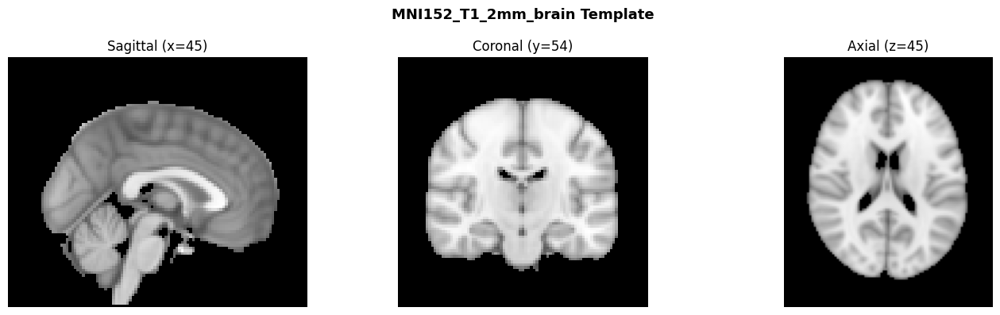

In [25]:
# === MNI152 Brain Template ===
print(f"MNI brain template path: {MNI_BRAIN_TEMPLATE}")
print(f"Exists: {MNI_BRAIN_TEMPLATE.exists()}")

if MNI_BRAIN_TEMPLATE.exists():
    mni_img = nib.load(MNI_BRAIN_TEMPLATE)
    mni_data = mni_img.get_fdata()
    print(f"Shape: {mni_img.shape}")
    print(f"Voxel size: {mni_img.header.get_zooms()[:3]}")
    print(f"Orientation (affine):\n{mni_img.affine}")

    show_slices(mni_data, title="MNI152_T1_2mm_brain Template", cmap="gray")
else:
    print("WARNING: MNI brain template not found!")

FLIRT: 5 affine-registered brains, 5 affine matrices found


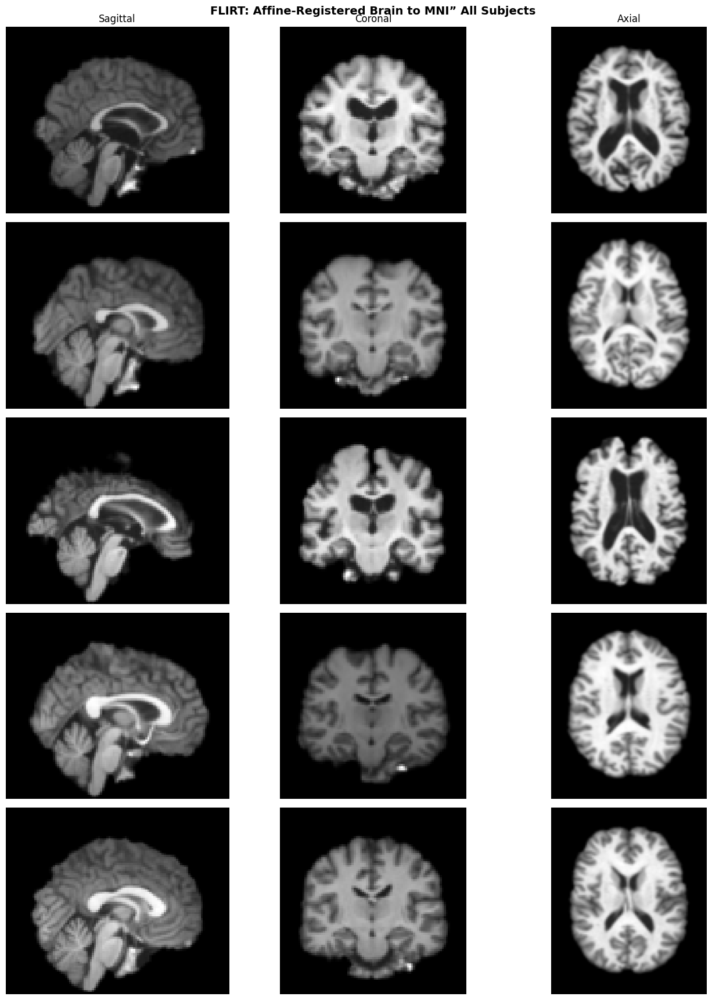

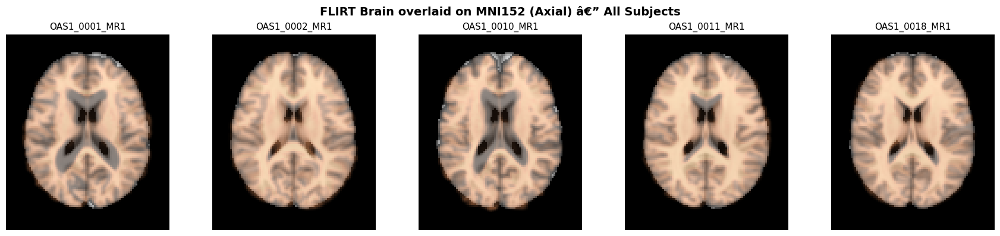

In [26]:
flirt_registered = find_cached_files(FLIRT_REGISTERED, step_name="flirt")
flirt_matrices = find_cached_files(FLIRT_MATRIX, step_name="flirt")
n_subj = len(flirt_registered)
print(f"FLIRT: {n_subj} affine-registered brains, {len(flirt_matrices)} affine matrices found")

if flirt_registered:
    mni_data = nib.load(MNI_BRAIN_TEMPLATE).get_fdata()

    fig, axes = plt.subplots(n_subj, 3, figsize=(14, 3.5 * n_subj))
    if n_subj == 1:
        axes = axes[np.newaxis, :]

    for i, rf in enumerate(flirt_registered):
        reg_data = nib.load(rf).get_fdata()
        shape = reg_data.shape[:3]
        mid = [s // 2 for s in shape]
        for col, (s, label) in enumerate(zip(mid, ["Sagittal", "Coronal", "Axial"])):
            idx = [slice(None)] * 3
            idx[col] = s
            axes[i, col].imshow(np.rot90(reg_data[tuple(idx)]), cmap="gray")
            axes[i, col].axis("off")
            if i == 0:
                axes[i, col].set_title(label, fontsize=12)
        axes[i, 0].set_ylabel(SUBJECTS[i] if SUBJECTS else f"Subj {i+1}", fontsize=11, fontweight="bold",
                               rotation=0, labelpad=40, va="center")

    fig.suptitle("FLIRT: Affine-Registered Brain to MNI” All Subjects", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()

    # MNI overlay for all subjects (axial)
    fig2, axes2 = plt.subplots(1, n_subj, figsize=(3.5 * n_subj, 4))
    if n_subj == 1:
        axes2 = [axes2]
    mni_z = mni_data.shape[2] // 2
    for i, rf in enumerate(flirt_registered):
        reg_data = nib.load(rf).get_fdata()
        z = reg_data.shape[2] // 2
        axes2[i].imshow(np.rot90(mni_data[:, :, mni_z]), cmap="gray")
        fg = np.ma.masked_where(reg_data[:, :, z] <= 0.1, reg_data[:, :, z])
        axes2[i].imshow(np.rot90(fg), cmap="copper", alpha=0.5)
        axes2[i].set_title(SUBJECTS[i] if SUBJECTS else f"Subj {i+1}", fontsize=11)
        axes2[i].axis("off")
    fig2.suptitle("FLIRT Brain overlaid on MNI152 (Axial) â€” All Subjects", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()
else:
    print("No FLIRT outputs found yet. Re-run this cell after FLIRT steps complete.")

In [27]:
flirt_mats = find_cached_files(FLIRT_MATRIX, step_name="flirt")
for i, mf in enumerate(flirt_mats):
    mat_text = mf.read_text().strip()
    print(f"\nSubject {i+1} ({mf.parent.name[:12]}):")
    print(mat_text)


Subject 1 (16d9ebcee659):
1.131371917  -0.01015865403  0.01652272942  -0.2017696322  
-0.03324798909  1.078141657  0.2362284693  -41.63602034  
-0.0344813372  -0.2392361671  1.160384884  -42.66508599  
0  0  0  1

Subject 2 (5764fa6ed465):
1.132365538  -0.02023875276  -0.03925972682  7.952647393  
0.03411289024  1.151812018  0.06267361205  -29.04502125  
0.02582808563  0.04225376445  1.263256538  -119.6928684  
0  0  0  1

Subject 3 (319945089d67):
1.071199856  0.06222771682  0.06895336389  -10.51317682  
-0.1327267693  1.001847617  0.3370605648  -47.04791629  
-0.04771173503  -0.3179024504  1.132971222  -62.15298867  
0  0  0  1

Subject 4 (3cdd4269099c):
1.134917284  0.02538488652  0.004241928007  -4.062980252  
-0.07207124986  1.081332314  -0.09918597008  2.569206854  
-0.02444997936  0.04227832451  1.172324384  -87.75330405  
0  0  0  1

Subject 5 (fe08a747dc4c):
1.079445033  0.06114857752  0.08962730308  -11.40513407  
-0.0538393309  1.034123469  -0.07659583158  5.289254396  
-0.

## Step 5: FNIRT (Non-linear Registration)

Non-linearly registers the brain-extracted T1 to MNI152, initialized with the FLIRT affine matrix.  
Produces a warp field and Jacobian determinant map (used for modulation in step 7).

Expected outputs: `gm_nonlinear.nii.gz`, `struct2mni_warp.nii.gz`, `jacobian.nii.gz`

In [110]:
config_path = ADDITIONAL_INPUTS / "T1_2_MNI152_2mm.cnf"
print(f"\nFNIRT config path: {config_path}")
print(f"Exists: {config_path.exists()}")
if config_path.exists():
    print(f"\n--- Config contents ---")
    print(config_path.read_text())


FNIRT config path: vbm_alzheimers_crate\additional_inputs\T1_2_MNI152_2mm.cnf
Exists: True

--- Config contents ---
# 	name of reference image
# --ref=/usr/local/fsl/data/standard/MNI152_T1_2mm.nii.gz
--ref=MNI152_T1_2mm
#	name of file with mask in reference space
# --refmask=/usr/local/fsl/data/standard/MNI152_T1_2mm_brain_mask_dil.nii.gz
--refmask=MNI152_T1_2mm_brain_mask_dil
#	If =1, use implicit masking based on value in --ref image. Default =1
--imprefm=1
#	If =1, use implicit masking based on value in --in image, Default =1
--impinm=1
#	Value to mask out in --ref image. Default =0.0
--imprefval=0
#	Value to mask out in --in image. Default =0.0
--impinval=0
#	sub-sampling scheme, default 4,2,1,1
--subsamp=4,4,2,2,1,1
# 	Max # of non-linear iterations, default 5,5,5,5
--miter=5,5,5,5,5,10
#	FWHM (in mm) of gaussian smoothing kernel for input volume, default 6,4,2,2
--infwhm=8,6,5,4.5,3,2
#	FWHM (in mm) of gaussian smoothing kernel for ref volume, default 4,2,0,0
--reffwhm=8,6,5,4,

FNIRT: 5 warped images, 5 warp fields, 5 Jacobian maps found


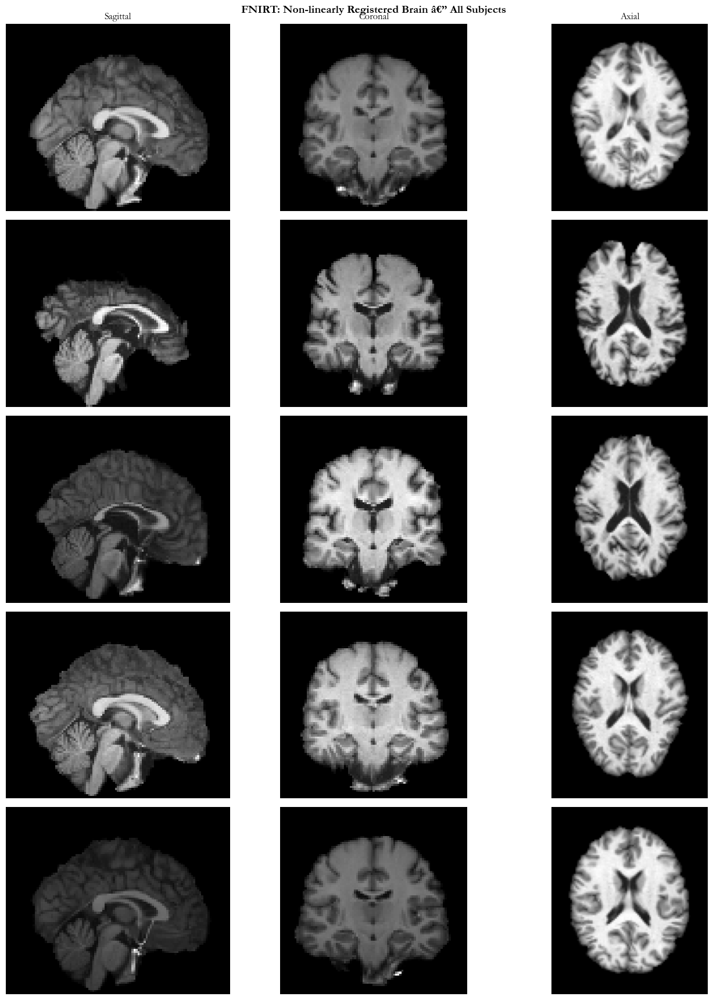

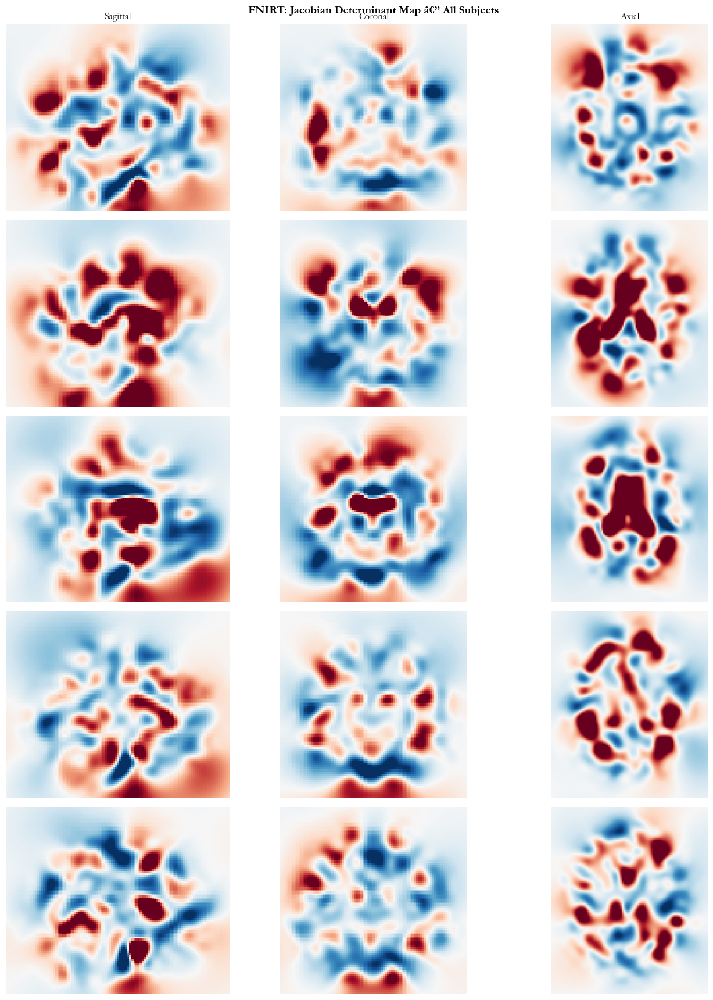


Jacobian stats across 5 subjects:
  Subject 1: min=0.123, max=3.077, mean=0.994, std=0.169
  Subject 2: min=0.201, max=4.451, mean=1.008, std=0.211
  Subject 3: min=0.173, max=5.295, mean=0.998, std=0.229
  Subject 4: min=0.065, max=3.274, mean=0.999, std=0.188
  Subject 5: min=0.110, max=4.279, mean=1.000, std=0.172


In [113]:
fnirt_warped = find_cached_files(FNIRT_WARPED, step_name="fnirt")
fnirt_warp = find_cached_files(FNIRT_WARP, step_name="fnirt")
fnirt_jacobian = find_cached_files(FNIRT_JACOBIAN, step_name="fnirt")
n_subj = len(fnirt_warped)
print(f"FNIRT: {n_subj} warped images, {len(fnirt_warp)} warp fields, {len(fnirt_jacobian)} Jacobian maps found")

if fnirt_warped:
    # Grid: subjects Ã— (sagittal, coronal, axial)
    fig, axes = plt.subplots(n_subj, 3, figsize=(14, 3.5 * n_subj))
    if n_subj == 1:
        axes = axes[np.newaxis, :]

    for i, wf in enumerate(fnirt_warped):
        warped_data = nib.load(wf).get_fdata()
        shape = warped_data.shape[:3]
        mid = [s // 2 for s in shape]
        for col, (s, label) in enumerate(zip(mid, ["Sagittal", "Coronal", "Axial"])):
            idx = [slice(None)] * 3
            idx[col] = s
            axes[i, col].imshow(np.rot90(warped_data[tuple(idx)]), cmap="gray")
            axes[i, col].axis("off")
            if i == 0:
                axes[i, col].set_title(label, fontsize=12)
        axes[i, 0].set_ylabel(SUBJECTS[i] if SUBJECTS else f"Subj {i+1}", fontsize=11, fontweight="bold",
                               rotation=0, labelpad=40, va="center")

    fig.suptitle("FNIRT: Non-linearly Registered Brain â€” All Subjects", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()

    if fnirt_jacobian:
        # Jacobian maps: subjects Ã— (sagittal, coronal, axial)
        fig2, axes2 = plt.subplots(n_subj, 3, figsize=(14, 3.5 * n_subj))
        if n_subj == 1:
            axes2 = axes2[np.newaxis, :]

        for i, jf in enumerate(fnirt_jacobian):
            jac_data = nib.load(jf).get_fdata()
            shape = jac_data.shape[:3]
            mid = [s // 2 for s in shape]
            for col, (s, label) in enumerate(zip(mid, ["Sagittal", "Coronal", "Axial"])):
                idx = [slice(None)] * 3
                idx[col] = s
                axes2[i, col].imshow(np.rot90(jac_data[tuple(idx)]), cmap="RdBu_r",
                                     vmin=0.5, vmax=1.5)
                axes2[i, col].axis("off")
                if i == 0:
                    axes2[i, col].set_title(label, fontsize=12)
            axes2[i, 0].set_ylabel(SUBJECTS[i] if SUBJECTS else f"Subj {i+1}", fontsize=11, fontweight="bold",
                                    rotation=0, labelpad=40, va="center")

        fig2.suptitle("FNIRT: Jacobian Determinant Map â€” All Subjects", fontsize=14, fontweight="bold")
        plt.tight_layout()
        plt.show()

        print(f"\nJacobian stats across {len(fnirt_jacobian)} subjects:")
        for i, jf in enumerate(fnirt_jacobian):
            jd = nib.load(jf).get_fdata()
            print(f"  Subject {i+1}: min={jd.min():.3f}, max={jd.max():.3f}, "
                  f"mean={jd.mean():.3f}, std={jd.std():.3f}")
else:
    print("No FNIRT outputs found yet. Re-run this cell after FNIRT steps complete.")

## Step 6: applywarp (Warp GM to MNI)

Applies the FNIRT non-linear warp field to the FAST gray matter probability map, transforming it from native space into MNI152 standard space.

Expected output: `gm_mni.nii.gz`

In [12]:
applywarp_gm = find_cached_files(APPLYWARP_GM, step_name="applywarp")
n_subj = len(applywarp_gm)
print(f"applywarp: {n_subj} warped GM maps found")

if applywarp_gm:
    mni_data = nib.load(MNI_BRAIN_TEMPLATE).get_fdata()

    # Grid: subjects Ã— (sagittal, coronal, axial)
    fig, axes = plt.subplots(n_subj, 3, figsize=(14, 3.5 * n_subj))
    if n_subj == 1:
        axes = axes[np.newaxis, :]

    for i, af in enumerate(applywarp_gm):
        gm_data = nib.load(af).get_fdata()
        shape = gm_data.shape[:3]
        mid = [s // 2 for s in shape]
        for col, (s, label) in enumerate(zip(mid, ["Sagittal", "Coronal", "Axial"])):
            idx = [slice(None)] * 3
            idx[col] = s
            axes[i, col].imshow(np.rot90(gm_data[tuple(idx)]), cmap="hot", vmin=0, vmax=1)
            axes[i, col].axis("off")
            if i == 0:
                axes[i, col].set_title(label, fontsize=12)
        axes[i, 0].set_ylabel(SUBJECTS[i] if SUBJECTS else f"Subj {i+1}", fontsize=11, fontweight="bold",
                               rotation=0, labelpad=40, va="center")

    fig.suptitle("applywarp: GM Probability Map in MNI Space â€” All Subjects", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()

    # Overlay GM on MNI template (axial)
    fig2, axes2 = plt.subplots(1, n_subj, figsize=(3.5 * n_subj, 4))
    if n_subj == 1:
        axes2 = [axes2]
    mni_z = mni_data.shape[2] // 2
    for i, af in enumerate(applywarp_gm):
        gm_data = nib.load(af).get_fdata()
        z = gm_data.shape[2] // 2
        axes2[i].imshow(np.rot90(mni_data[:, :, mni_z]), cmap="gray")
        fg = np.ma.masked_where(gm_data[:, :, z] <= 0.1, gm_data[:, :, z])
        axes2[i].imshow(np.rot90(fg), cmap="hot", alpha=0.5)
        axes2[i].set_title(SUBJECTS[i] if SUBJECTS else f"Subj {i+1}", fontsize=11)
        axes2[i].axis("off")
    fig2.suptitle("GM in MNI overlaid on MNI152 (Axial) â€” All Subjects", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()
else:
    print("No applywarp outputs found yet. Re-run this cell after applywarp steps complete.")

Cache directory not found.
applywarp: 0 warped GM maps found
No applywarp outputs found yet. Re-run this cell after applywarp steps complete.


## Step 7: fslmaths (Jacobian Modulation)

Multiplies the warped GM map (from applywarp) by the Jacobian determinant to preserve local tissue volume after non-linear registration.

Expected output: `gm_modulated.nii.gz`

fslmaths (modulation): 5 modulated GM maps found


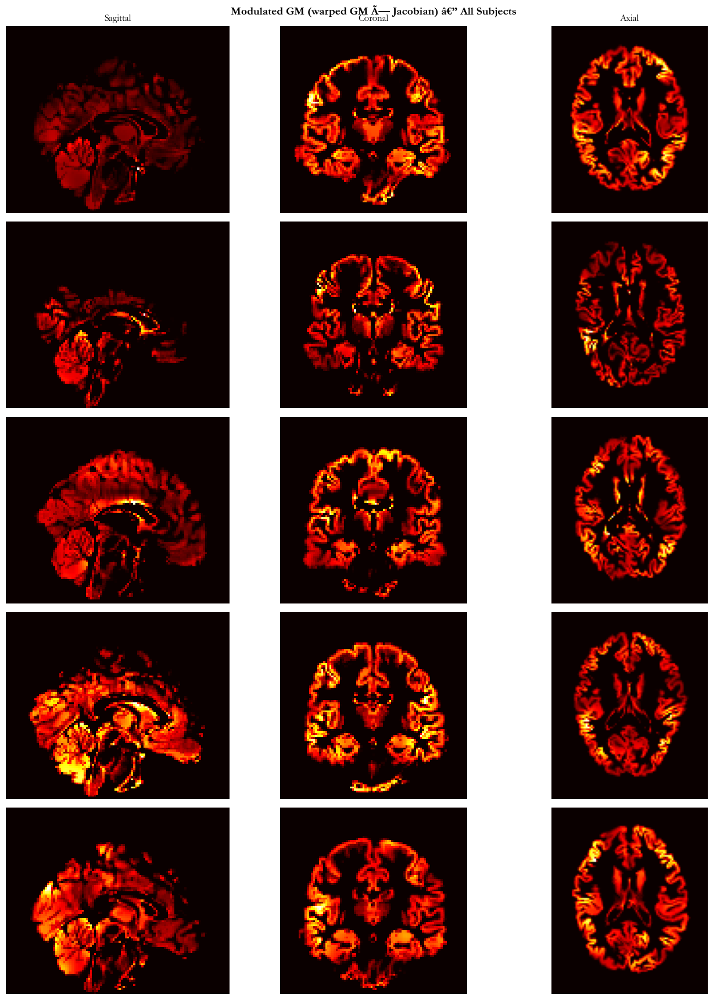


Modulated GM stats across 5 subjects:
  Subject 1: min=0.0000, max=4.2063, mean(>0)=0.5770
  Subject 2: min=0.0000, max=3.9747, mean(>0)=0.5372
  Subject 3: min=0.0000, max=3.3076, mean(>0)=0.5825
  Subject 4: min=0.0000, max=3.2063, mean(>0)=0.6022
  Subject 5: min=0.0000, max=3.0283, mean(>0)=0.5778


In [117]:
modulated = find_cached_files(MODULATED_GM, step_name="fslmaths_1")
n_subj = len(modulated)
print(f"fslmaths (modulation): {n_subj} modulated GM maps found")

if modulated:
    # Grid: subjects Ã— (sagittal, coronal, axial)
    fig, axes = plt.subplots(n_subj, 3, figsize=(14, 3.5 * n_subj))
    if n_subj == 1:
        axes = axes[np.newaxis, :]

    for i, mf in enumerate(modulated):
        mod_data = nib.load(mf).get_fdata()
        shape = mod_data.shape[:3]
        mid = [s // 2 for s in shape]
        for col, (s, label) in enumerate(zip(mid, ["Sagittal", "Coronal", "Axial"])):
            idx = [slice(None)] * 3
            idx[col] = s
            axes[i, col].imshow(np.rot90(mod_data[tuple(idx)]), cmap="hot")
            axes[i, col].axis("off")
            if i == 0:
                axes[i, col].set_title(label, fontsize=12)
        axes[i, 0].set_ylabel(SUBJECTS[i] if SUBJECTS else f"Subj {i+1}", fontsize=11, fontweight="bold",
                               rotation=0, labelpad=40, va="center")

    fig.suptitle("Modulated GM (warped GM Ã— Jacobian) â€” All Subjects", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()

    print(f"\nModulated GM stats across {n_subj} subjects:")
    for i, mf in enumerate(modulated):
        md = nib.load(mf).get_fdata()
        print(f"  Subject {i+1}: min={md.min():.4f}, max={md.max():.4f}, "
              f"mean(>0)={md[md > 0].mean():.4f}")
else:
    print("No modulation outputs found yet. Re-run this cell after fslmaths modulation steps complete.")

## Step 8: fslmaths (Spatial Smoothing)

Gaussian spatial smoothing of modulated GM maps (sigma=3mm, ~7mm FWHM).  
This is the final single-subject preprocessing step.

Expected output: `gm_smooth.nii.gz`

fslmaths (smoothing): 5 smoothed GM maps found


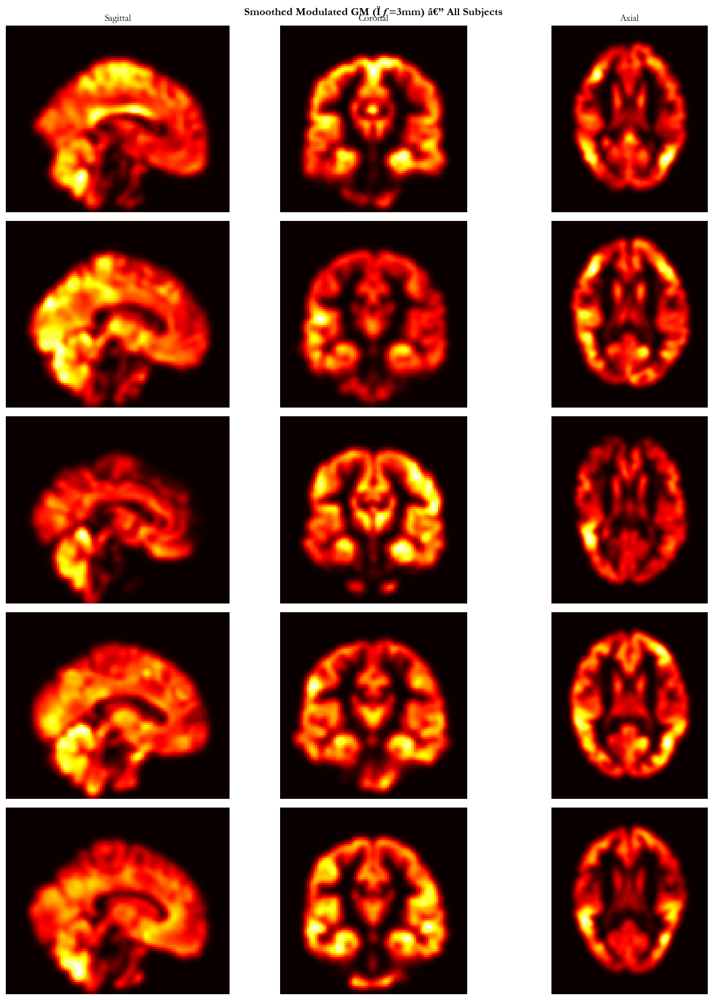

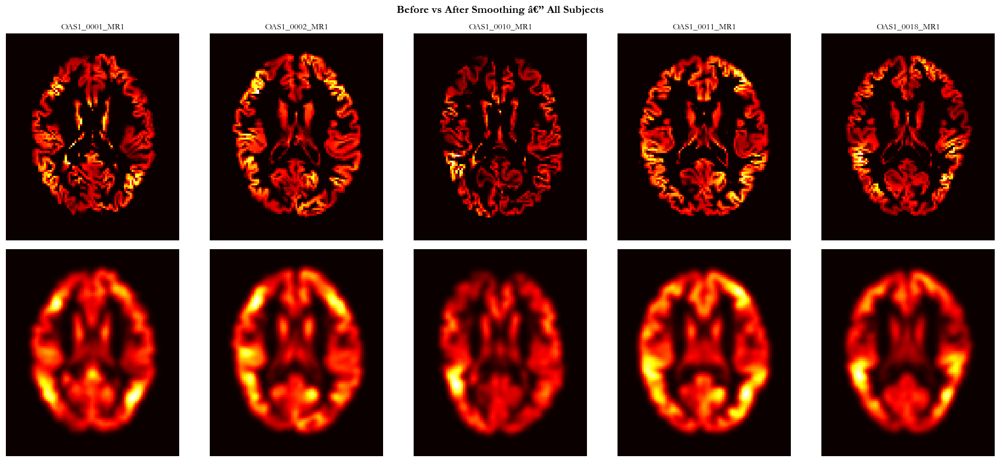

In [138]:
smoothed = find_cached_files(SMOOTHED_GM, step_name="fslmaths_2")
n_subj = len(smoothed)
print(f"fslmaths (smoothing): {n_subj} smoothed GM maps found")

if smoothed:
    # Grid: subjects Ã— (sagittal, coronal, axial)
    fig, axes = plt.subplots(n_subj, 3, figsize=(14, 3.5 * n_subj))
    if n_subj == 1:
        axes = axes[np.newaxis, :]

    for i, sf in enumerate(smoothed):
        smooth_data = nib.load(sf).get_fdata()
        shape = smooth_data.shape[:3]
        mid = [s // 2 for s in shape]
        for col, (s, label) in enumerate(zip(mid, ["Sagittal", "Coronal", "Axial"])):
            idx = [slice(None)] * 3
            idx[col] = s
            axes[i, col].imshow(np.rot90(smooth_data[tuple(idx)]), cmap="hot")
            axes[i, col].axis("off")
            if i == 0:
                axes[i, col].set_title(label, fontsize=12)
        axes[i, 0].set_ylabel(SUBJECTS[i] if SUBJECTS else f"Subj {i+1}", fontsize=11, fontweight="bold",
                               rotation=0, labelpad=40, va="center")

    fig.suptitle("Smoothed Modulated GM (Ïƒ=3mm) â€” All Subjects", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()

    # Before vs after smoothing comparison (axial, all subjects)
    if modulated:
        fig2, axes2 = plt.subplots(2, n_subj, figsize=(3.5 * n_subj, 8))
        if n_subj == 1:
            axes2 = axes2[:, np.newaxis]

        for i in range(n_subj):
            mod_data = nib.load(modulated[i]).get_fdata()
            smo_data = nib.load(smoothed[i]).get_fdata()
            z = mod_data.shape[2] // 2
            axes2[0, i].imshow(np.rot90(mod_data[:, :, z]), cmap="hot")
            axes2[0, i].axis("off")
            axes2[0, i].set_title(SUBJECTS[i] if SUBJECTS else f"Subj {i+1}", fontsize=11)
            axes2[1, i].imshow(np.rot90(smo_data[:, :, z]), cmap="hot")
            axes2[1, i].axis("off")

        axes2[0, 0].set_ylabel("Modulated", fontsize=11, fontweight="bold",
                                rotation=0, labelpad=60, va="center")
        axes2[1, 0].set_ylabel("Smoothed", fontsize=11, fontweight="bold",
                                rotation=0, labelpad=60, va="center")
        fig2.suptitle("Before vs After Smoothing â€” All Subjects", fontsize=14, fontweight="bold")
        plt.tight_layout()
        plt.show()
else:
    print("No smoothing outputs found yet. Re-run this cell after fslmaths smoothing steps complete.")

## Figure Panels — OAS1_0011_MR1

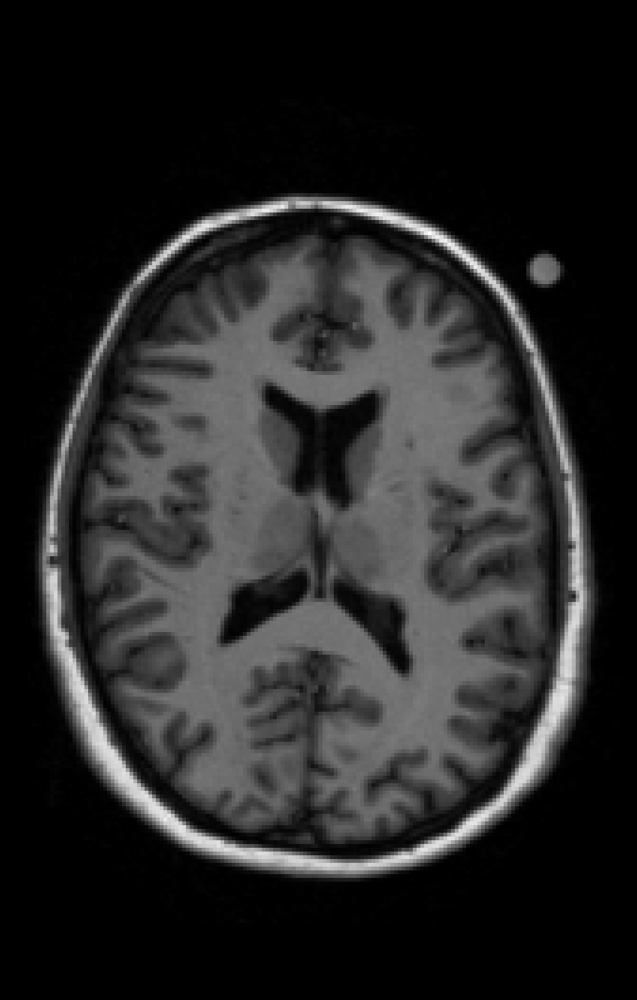

In [72]:
# Figure: Axial T1w (raw) — OAS1_0011_MR1
subj_idx = 3
t1_img = nib.load(RAW_DATA_DIR / f"{SUBJECTS[subj_idx]}.nii.gz")
t1_data = t1_img.get_fdata()
az = int(t1_data.shape[2] * 0.575)

t1_slice = t1_data[:, :, az].copy()
threshold = np.percentile(t1_slice[t1_slice > 0], 10)
t1_slice[t1_slice < threshold] = 0

fig = plt.figure(figsize=(6, 6), dpi=300)
plt.imshow(np.rot90(t1_slice), cmap="gray", interpolation="none", vmin=threshold)
plt.axis("off")
fig.patch.set_facecolor("black")
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
fig.savefig("../../visualizations/fig7/t1_axial.png", dpi=300, bbox_inches="tight", pad_inches=0, facecolor="black")

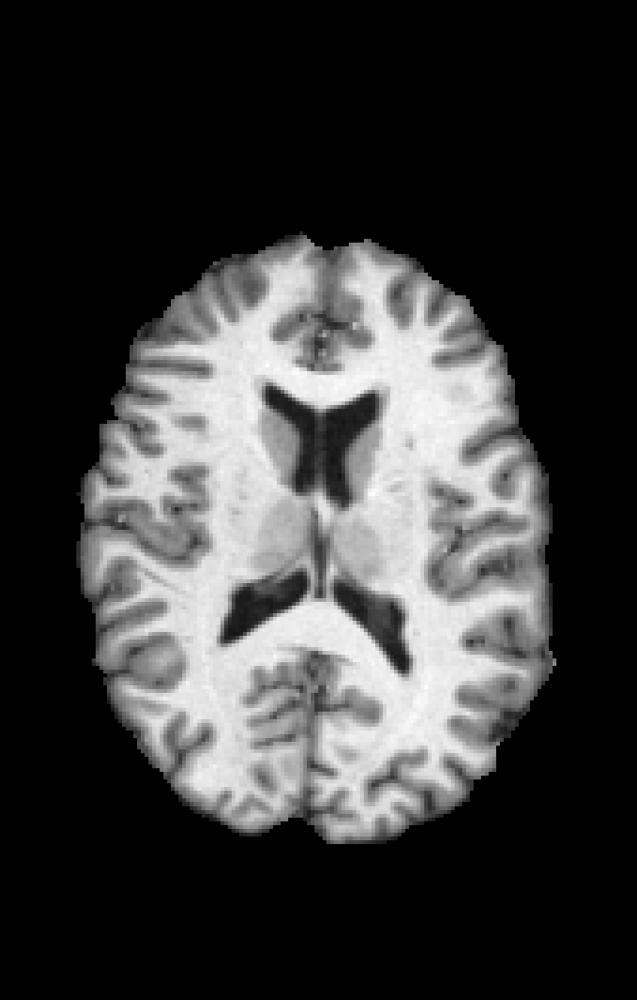

In [53]:
# Figure: Axial BET brain — OAS1_0011_MR1
bet_file = find_cached_files(BET_BRAIN, step_name="bet")[subj_idx]
bet_data = nib.load(bet_file).get_fdata()
az = int(bet_data.shape[2] * 0.575)

fig = plt.figure(figsize=(6, 6), dpi=300)
plt.imshow(np.rot90(bet_data[:, :, az]), cmap="gray", interpolation="none")
plt.axis("off")
fig.patch.set_facecolor("black")
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
fig.savefig("bet_axial.png", dpi=300, bbox_inches="tight", pad_inches=0, facecolor="black")

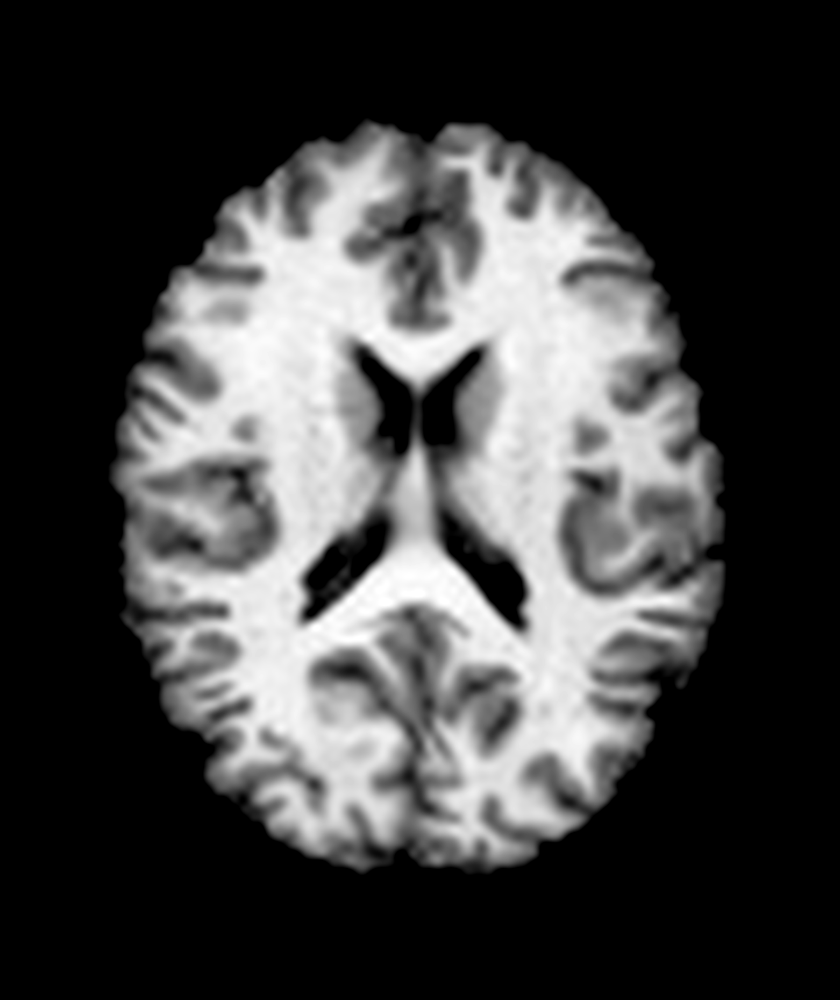

In [67]:
# Figure: Axial FNIRT — OAS1_0011_MR1
fnirt_file = find_cached_files(FNIRT_WARPED, step_name="fnirt")[subj_idx]
fnirt_data = nib.load(fnirt_file).get_fdata()
az = fnirt_data.shape[2] // 2

fnirt_slice = fnirt_data[:, :, az].copy()
threshold = np.percentile(fnirt_slice[fnirt_slice > 0], 5)
fnirt_slice[fnirt_slice < threshold] = 0

fig = plt.figure(figsize=(6, 6), dpi=300)
plt.imshow(np.rot90(fnirt_slice), cmap="gray", interpolation="lanczos", vmin=threshold)
plt.axis("off")
fig.patch.set_facecolor("black")
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
fig.savefig("../../visualizations/fig7/fnirt_axial.png", dpi=300, bbox_inches="tight", pad_inches=0, facecolor="black")

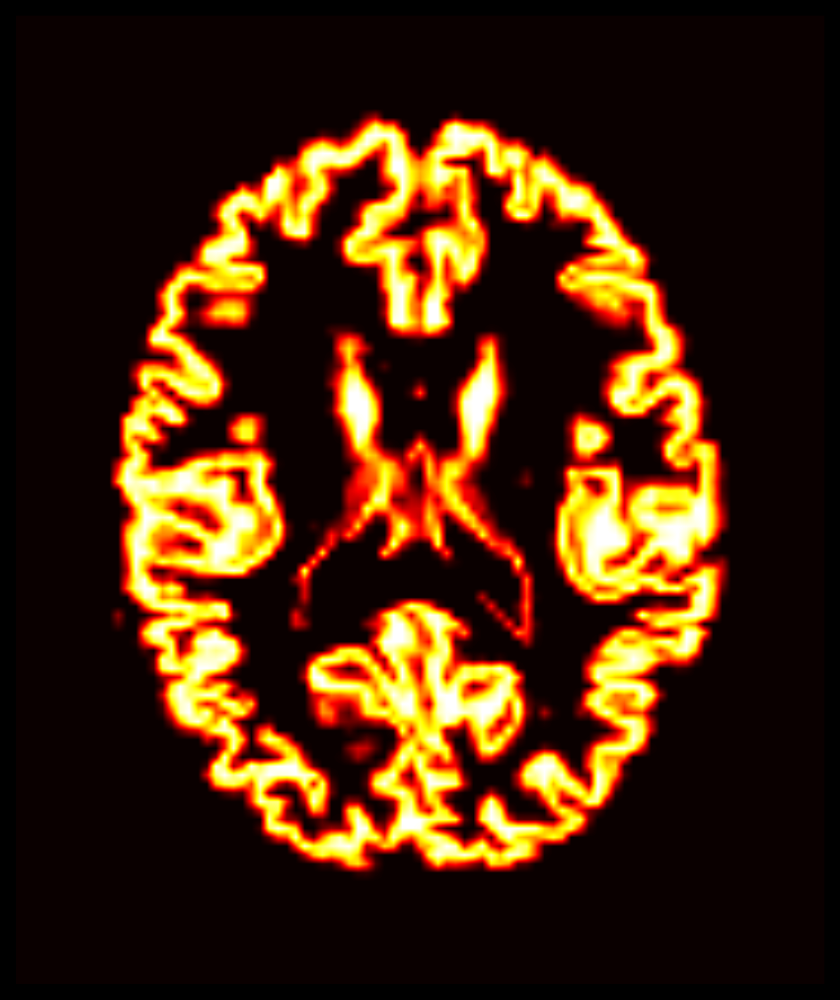

In [85]:
# Figure: Axial applywarp GM — OAS1_0011_MR1
aw_file = find_cached_files(APPLYWARP_GM, step_name="applywarp")[subj_idx]
aw_data = nib.load(aw_file).get_fdata()
az = aw_data.shape[2] // 2

fig = plt.figure(figsize=(6, 6), dpi=300)
plt.imshow(np.rot90(aw_data[:, :, az]), cmap="hot", interpolation="bilinear")
plt.axis("off")
fig.patch.set_facecolor("black")
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
fig.savefig("../../visualizations/fig7/applywarp_axial.png", dpi=300, bbox_inches="tight", pad_inches=0, facecolor="black")

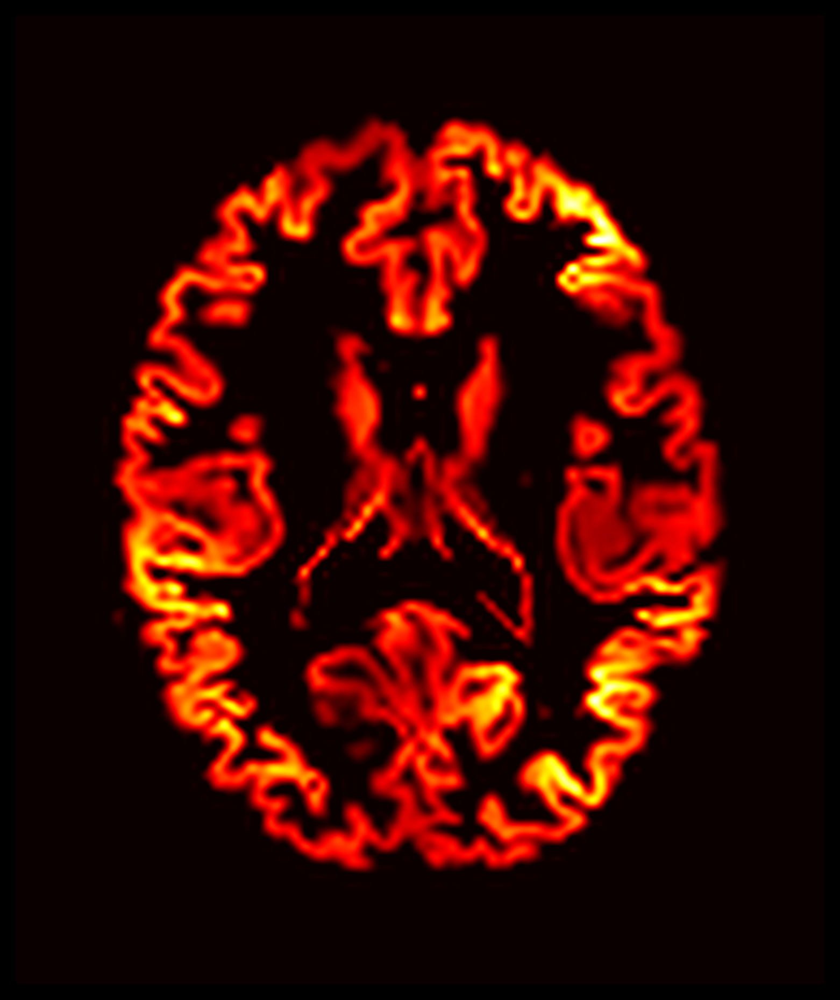

In [40]:
# Figure: Axial modulated GM — OAS1_0011_MR1
mod_file = find_cached_files(MODULATED_GM, step_name="fslmaths_1")[subj_idx]
mod_data = nib.load(mod_file).get_fdata()
az = mod_data.shape[2] // 2

fig = plt.figure(figsize=(6, 6), dpi=300)
plt.imshow(np.rot90(mod_data[:, :, az]), cmap="hot", interpolation="lanczos")
plt.axis("off")
fig.patch.set_facecolor("black")
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
fig.savefig("../../visualizations/fig7/modulated_axial.png", dpi=300, bbox_inches="tight", pad_inches=0, facecolor="black")

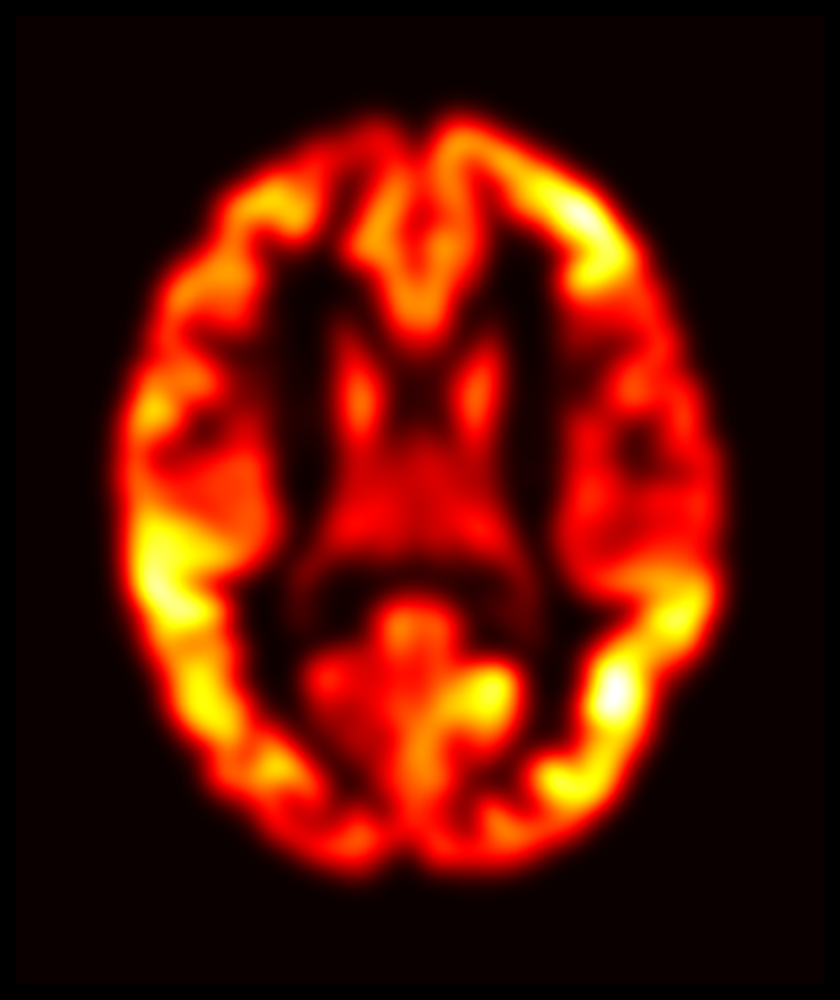

In [66]:
# Figure: Axial smoothed GM — OAS1_0011_MR1
smo_file = find_cached_files(SMOOTHED_GM, step_name="fslmaths_2")[subj_idx]
smo_data = nib.load(smo_file).get_fdata()
az = smo_data.shape[2] // 2

fig = plt.figure(figsize=(6, 6), dpi=300)
plt.imshow(np.rot90(smo_data[:, :, az]), cmap="hot", interpolation="lanczos")
plt.axis("off")
fig.patch.set_facecolor("black")
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
fig.savefig("../../visualizations/fig7/smoothed_axial.png", dpi=300, bbox_inches="tight", pad_inches=0, facecolor="black")

## Randomise Results — VBM Group Analysis

Statistical maps from `randomise` (non-parametric permutation testing, 5000 permutations, TFCE).

**Outputs:**
- `vbm_tstat1.nii.gz` — t-statistic for **Controls > AD** (regions of greater GM in controls)
- `vbm_tstat2.nii.gz` — t-statistic for **AD > Controls** (regions of greater GM in AD)
- `vbm_tfce_corrp_tstat1.nii.gz` — TFCE-corrected p-values (1-p) for contrast 1
- `vbm_tfce_corrp_tstat2.nii.gz` — TFCE-corrected p-values (1-p) for contrast 2

Significant voxels at p<0.05 (corrected) have `corrp > 0.95`.

In [82]:
OUTPUT_DIR = Path("output")

tstat1_path = OUTPUT_DIR / "vbm_tstat1.nii.gz"
tstat2_path = OUTPUT_DIR / "vbm_tstat2.nii.gz"
corrp1_path = OUTPUT_DIR / "vbm_tfce_corrp_tstat1.nii.gz"
corrp2_path = OUTPUT_DIR / "vbm_tfce_corrp_tstat2.nii.gz"
mni_path = "../flanker/flanker_analysis/additional_inputs/MNI152_T1_1mm.nii.gz"

# Verify files exist
for p in [tstat1_path, tstat2_path, corrp1_path, corrp2_path]:
    print(f"{'[OK]' if p.exists() else '[MISSING]'} {p.name}")

# Load MNI template for underlay
mni_data = nib.load(MNI_BRAIN_TEMPLATE).get_fdata()
print(f"\nMNI template shape: {mni_data.shape}")

# Load all stat maps
tstat1 = nib.load(tstat1_path).get_fdata()
tstat2 = nib.load(tstat2_path).get_fdata()
corrp1 = nib.load(corrp1_path).get_fdata()
corrp2 = nib.load(corrp2_path).get_fdata()

print(f"tstat1 range: [{tstat1.min():.2f}, {tstat1.max():.2f}]")
print(f"tstat2 range: [{tstat2.min():.2f}, {tstat2.max():.2f}]")
print(f"corrp1 range: [{corrp1.min():.4f}, {corrp1.max():.4f}]")
print(f"corrp2 range: [{corrp2.min():.4f}, {corrp2.max():.4f}]")

# Count significant voxels
sig1 = (corrp1 > 0.95).sum()
sig2 = (corrp2 > 0.95).sum()
print(f"\nSignificant voxels (p<0.05 corrected):")
print(f"  Controls > AD: {sig1}")
print(f"  AD > Controls: {sig2}")

for name, corrp, tstat in [("Controls > AD", corrp1, tstat1), ("AD > Controls", corrp2, tstat2)]:
    sig_mask = corrp > 0.95
    n_sig = sig_mask.sum()
    print(f"\n{'='*50}")
    print(f"{name}")
    print(f"{'='*50}")
    print(f"Significant voxels (p<0.05 corrected): {n_sig}")

    if n_sig > 0:
        # Peak voxel
        peak_idx = np.unravel_index(np.argmax(corrp), corrp.shape)
        print(f"Peak corrp value: {corrp[peak_idx]:.4f} (1-p)")
        print(f"Peak t-stat: {tstat[peak_idx]:.2f}")
        print(f"Peak voxel (i,j,k): {peak_idx}")

        # Cluster labeling
        labeled, n_clusters = ndimage.label(sig_mask)
        print(f"Number of clusters: {n_clusters}")
        for c in range(1, n_clusters + 1):
            cluster_size = (labeled == c).sum()
            cluster_peak = np.max(tstat[labeled == c])
            print(f"  Cluster {c}: {cluster_size} voxels, peak t={cluster_peak:.2f}")
    else:
        # Show max corrp even if not significant
        print(f"Max corrp value: {corrp.max():.4f}")
        print(f"Max t-stat: {tstat.max():.2f}")

    # Distribution of corrp > 0
    nonzero = corrp[corrp > 0]
    if len(nonzero) > 0:
        print(f"\ncorrp > 0: {len(nonzero)} voxels")
        for thresh in [0.90, 0.95, 0.99]:
            print(f"  corrp > {thresh}: {(corrp > thresh).sum()} voxels")

[OK] vbm_tstat1.nii.gz
[OK] vbm_tstat2.nii.gz
[OK] vbm_tfce_corrp_tstat1.nii.gz
[OK] vbm_tfce_corrp_tstat2.nii.gz

MNI template shape: (91, 109, 91)
tstat1 range: [-3.53, 5.59]
tstat2 range: [-5.59, 3.53]
corrp1 range: [0.0000, 0.9940]
corrp2 range: [0.0000, 0.2752]

Significant voxels (p<0.05 corrected):
  Controls > AD: 1781
  AD > Controls: 0

Controls > AD
Significant voxels (p<0.05 corrected): 1781
Peak corrp value: 0.9940 (1-p)
Peak t-stat: 5.26
Peak voxel (i,j,k): (np.int64(31), np.int64(65), np.int64(25))
Number of clusters: 5
  Cluster 1: 97 voxels, peak t=4.60
  Cluster 2: 8 voxels, peak t=3.85
  Cluster 3: 675 voxels, peak t=5.30
  Cluster 4: 524 voxels, peak t=5.59
  Cluster 5: 477 voxels, peak t=4.88

corrp > 0: 69708 voxels
  corrp > 0.9: 4229 voxels
  corrp > 0.95: 1781 voxels
  corrp > 0.99: 77 voxels

AD > Controls
Significant voxels (p<0.05 corrected): 0
Max corrp value: 0.2752
Max t-stat: 3.53

corrp > 0: 36039 voxels
  corrp > 0.9: 0 voxels
  corrp > 0.95: 0 voxels


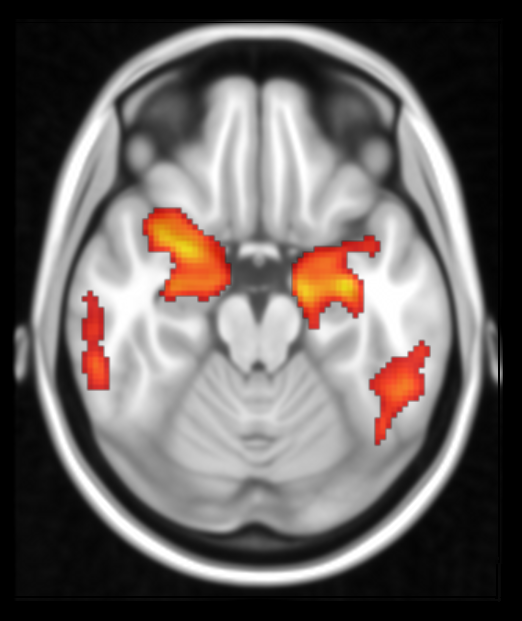

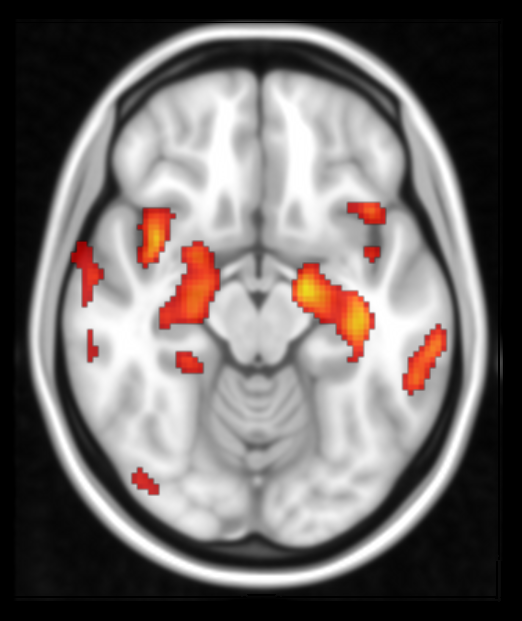

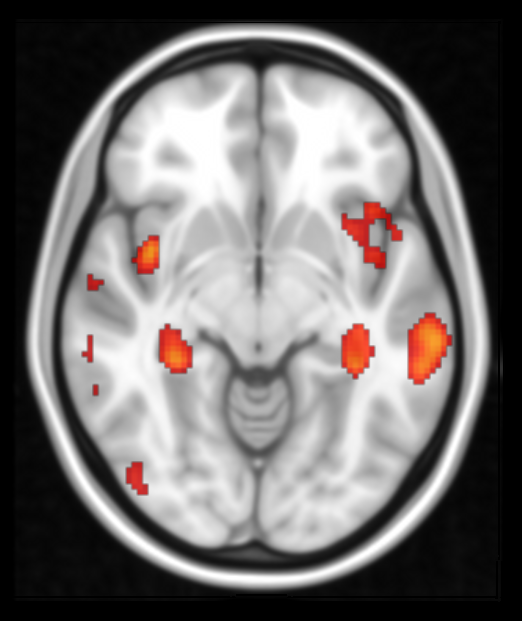

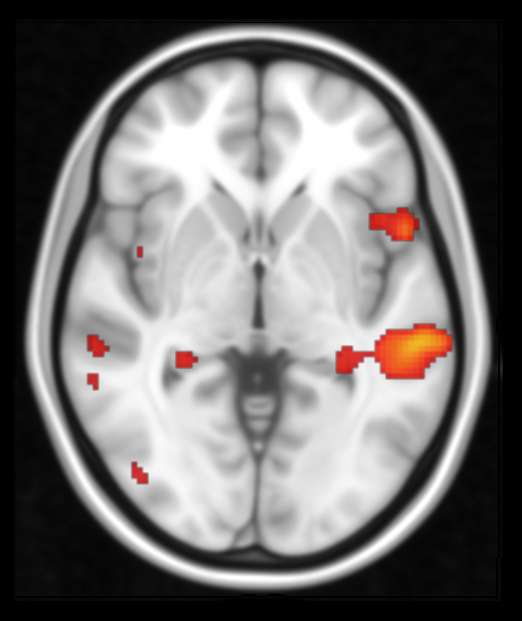

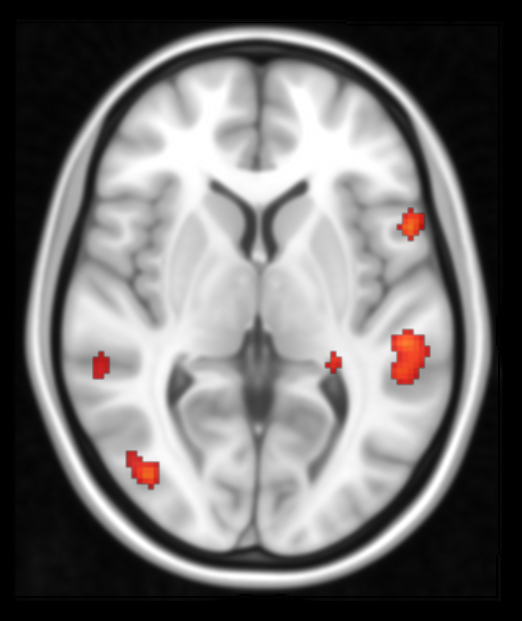

In [95]:
from scipy.ndimage import gaussian_filter

TFCE_THRESH = 0.8
ALPHA = 0.8
SIGMA = 0.0 # Gaussian blur sigma for overlay smoothing
# MNI_Z_SLICES = [-20, -14, -8, -2, 4, 10, 16, 22, 28, 34]
MNI_Z_SLICES = [-20, -14, -8, -2, 4]

corrp_img = nib.load(corrp1_path)
corrp_data = corrp_img.get_fdata()
corrp_affine = corrp_img.affine

tstat_img = nib.load(tstat1_path)
tstat_data = tstat_img.get_fdata()

mni_img = nib.load(mni_path)
mni_data = mni_img.get_fdata()
mni_affine = mni_img.affine

warm_cmap = LinearSegmentedColormap.from_list('warm',
    ['#8B0000', '#CC0000', '#FF2200', '#FF6600', '#FF9900', '#FFCC00', '#FFFF00'], N=256)

def mni_to_voxel(x, y, z, affine):
    inv_affine = np.linalg.inv(affine)
    vox = inv_affine @ np.array([x, y, z, 1.0])
    return int(round(vox[0])), int(round(vox[1])), int(round(vox[2]))

corrp_voxsize = np.abs(np.diag(corrp_affine)[:3])
mni_voxsize = np.abs(np.diag(mni_affine)[:3])
zoom_factors = corrp_voxsize / mni_voxsize

if not np.allclose(zoom_factors, 1.0, atol=0.01):
    corrp_upsampled = zoom(corrp_data, zoom_factors, order=0)
    tstat_upsampled = zoom(tstat_data, zoom_factors, order=0)
else:
    corrp_upsampled = corrp_data
    tstat_upsampled = tstat_data

min_shape = tuple(min(a, b) for a, b in zip(mni_data.shape[:3], corrp_upsampled.shape[:3]))
mni_cropped = mni_data[:min_shape[0], :min_shape[1], :min_shape[2]]
corrp_cropped = corrp_upsampled[:min_shape[0], :min_shape[1], :min_shape[2]]
tstat_cropped = tstat_upsampled[:min_shape[0], :min_shape[1], :min_shape[2]]

for mni_z in MNI_Z_SLICES:
    _, _, az = mni_to_voxel(0, 0, mni_z, mni_affine)
    az = np.clip(az, 0, min_shape[2] - 1)

    bg = np.rot90(mni_cropped[:, :, az])
    sig = corrp_cropped[:, :, az].copy()
    tvals = tstat_cropped[:, :, az].copy()

    n_sig = np.sum(sig > 0.95)

    tvals[sig <= TFCE_THRESH] = 0
    tvals_rot = np.rot90(tvals)

    # Apply Gaussian blur then re-mask to brain
    brain_mask = bg > 0
    tvals_smooth = gaussian_filter(tvals_rot, sigma=SIGMA)
    tvals_smooth[~brain_mask] = np.nan
    tvals_smooth[tvals_smooth <= 0] = np.nan

    h, w = bg.shape
    fig, ax = plt.subplots(1, 1, figsize=(w / 100 * 3, h / 100 * 3), facecolor='black')
    ax.set_facecolor('black')

    bg_masked = np.where(bg > 0, bg, np.nan)
    p2, p98 = np.percentile(bg[bg > 0], [2, 98]) if np.any(bg > 0) else (0, 1)
    ax.imshow(bg_masked, cmap='gray', interpolation='lanczos',
              aspect='equal', origin='upper', vmin=p2, vmax=p98)

    if np.any(~np.isnan(tvals_smooth)):
        ax.imshow(tvals_smooth, cmap=warm_cmap, interpolation='bilinear',
                  aspect='equal', origin='upper', vmin=2, vmax=5.6, alpha=ALPHA)

    ax.axis('off')
    plt.subplots_adjust(left=0, right=1, top=0.92, bottom=0)
    plt.show()

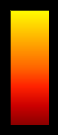

In [74]:
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

fig, cax = plt.subplots(1, 1, figsize=(0.5, 1.5), facecolor='black')
norm = Normalize(vmin=0, vmax=tstat_data.max())
cb = ColorbarBase(cax, cmap=warm_cmap, norm=norm, orientation='vertical')
cb.set_ticks([])
cb.outline.set_linewidth(0.5)
plt.savefig('../../visualizations/fig7/colorbar_warm.svg', format='svg',
            facecolor='black', bbox_inches='tight', pad_inches=0.05)
plt.show()